# Multiple Linear Regression
## Housing Price Prediction - Assignment 

#### Problem Statement:

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia.  

The company is looking at prospective properties to buy to enter the market. To build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

Essentially, the company wants to know —

- Which variables are significant in predicting the the price of a house.
- How well those variables describe the the price of a house.

#### Business Goal 
To model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

#### Solution Steps 
- Data understanding and exploration
- Data Visualisation 
- Data preparation
- Model building and evaluation


# 1. Data Understanding

Let's first import the required libraries and have a look at the dataset and understand the size, attribute names etc.

In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import warnings
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn import metrics
import os
warnings.filterwarnings('ignore')

In [97]:
# Reading the dataset
Housing = pd.read_csv("C:/Users/I350694/Downloads/train.csv")

In [98]:
# Let's take a look at the first few rows
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
Housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [99]:
# Let's look at the number of rows and columns in the dataset
Housing.shape

(1460, 81)

In [100]:
# Getting insights of the features
Housing.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# 2. Data Preparation and Cleaning

Below issues are identified
1. Column ID is not relavant
2. Few columns contain null values, column value Electrical only 1 value is null so dropping it
3. Few numeric columns are null, hence replacing with median values eg LotFrontage GarageYrBlt, MasVnrArea
4. Added new field Age of House. Here we considered the difference of year of sale and built year
5. Dropped year related and date related columns as it does not seems relavant and we already considered the age of house
6. In the Sales Price there is some skewness during plotting the graph hence applying the log values of sales price. 
7. 1stFlrSF + 2ndFlrSF = GrLivArea hence dropping 1stFlrSF and 2ndFlrSF

In [101]:
Housing = Housing.drop(['Id','1stFlrSF' ,'2ndFlrSF'], axis = 1)

In [102]:
Housing.isnull().sum()

MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBa

In [103]:
Housing.describe(include="all")

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,0.000000,1.000000,2006.000000,NaN,NaN,34900.000000
25%,20.000000,NaN,59.000000,7553.500000,N

#### Convert Numerical variables like MSSubClass OverallQual OverallCond MoSold to Categorical Variables
1. MSSubClass to be converted to string variable, even though the column look like a numerical but there is not a 
clear distinction where 20 is a better value than 30 and hence we need to convert
2. Over all quality , over all condition and month sold are not to be converted as its ordinal values where 0 means low and 10 means a higher quality. For month sold we are dropping the column so not to be converted as a string variable

In [104]:
Housing.loc[(Housing['MSSubClass'] == 20) , 'MSSubClass'] = '1_STORY_1946_NEWER_ALL_STYLES'
Housing.loc[(Housing['MSSubClass'] == 30) , 'MSSubClass'] = '1_STORY_1945_OLDER'
Housing.loc[(Housing['MSSubClass'] == 40) , 'MSSubClass'] = '1_STORY_W/FINISHED_ATTIC_ALL_AGES'
Housing.loc[(Housing['MSSubClass'] == 45) , 'MSSubClass'] = '1_1/2_STORY_UNFINISHED_ALL_AGES'
Housing.loc[(Housing['MSSubClass'] == 50) , 'MSSubClass'] = '1-1/2_STORY_FINISHED_ALL_AGES'
Housing.loc[(Housing['MSSubClass'] == 60) , 'MSSubClass'] = '2-STORY_1946 & NEWER'
Housing.loc[(Housing['MSSubClass'] == 70) , 'MSSubClass'] = '2-STORY_1945 & OLDER'
Housing.loc[(Housing['MSSubClass'] == 75) , 'MSSubClass'] = '2-1/2_STORY_ALL_AGES'
Housing.loc[(Housing['MSSubClass'] == 80) , 'MSSubClass'] = 'SPLIT_MULTI-LEVEL'
Housing.loc[(Housing['MSSubClass'] == 85) , 'MSSubClass'] = 'SPLIT_FOYER'
Housing.loc[(Housing['MSSubClass'] == 90) , 'MSSubClass'] = 'DUPLEX_ALL STYLES AND AGES'
Housing.loc[(Housing['MSSubClass'] == 120) , 'MSSubClass'] = '1-STORY_PUD_1946 & NEWER'
Housing.loc[(Housing['MSSubClass'] == 150) , 'MSSubClass'] = '1-1/2_STORY PUD_ALL AGES'
Housing.loc[(Housing['MSSubClass'] == 160) , 'MSSubClass'] = '2-STORY_PUD_1946 & NEWER'
Housing.loc[(Housing['MSSubClass'] == 180) , 'MSSubClass'] = 'PUD_MULTILEVEL_INCL SPLIT LEV/FOYER'
Housing.loc[(Housing['MSSubClass'] == 190) , 'MSSubClass'] = '2_FAMILY_CONVERSION_ALL STYLES AND AGES'

In [105]:
categorical = ["MSSubClass","MSZoning", "Street", "Alley", "LotShape", "LandContour", 'Utilities','LotConfig','LandSlope', 'Neighborhood',
              'Condition1','Condition2','BldgType','HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st','Exterior2nd',
              'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 
               'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 
               'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
              'PavedDrive','PoolQC','Fence','MiscFeature','SaleType','SaleCondition']
nullcolumns=["Alley", "MasVnrType", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", 
             "FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", "MiscFeature"]
##toderive = ["Age of house"]
for i in nullcolumns:
    Housing[i].fillna("none", inplace=True)

In [106]:
Housing.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath     

In [107]:
Housing.columns[Housing.isnull().any()] 

Index(['LotFrontage', 'MasVnrArea', 'Electrical', 'GarageYrBlt'], dtype='object')

In [108]:
Housing['LotFrontage'] = Housing.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))
Housing["GarageYrBlt"].fillna(Housing["GarageYrBlt"].median(), inplace=True)
Housing["MasVnrArea"].fillna(Housing["MasVnrArea"].median(), inplace=True)
Housing["Electrical"].dropna(inplace=True)

In [109]:
Housing["AgeofHouse"] = Housing['YrSold'] - Housing['YearBuilt']
#Since age of house is considered we are dropping build year, Year sold and below date related columns
# Field BsmtFinSF2 contains 90% null values hence dropping it
Housing.drop(['YrSold', 'YearRemodAdd', 'MoSold' , 'GarageYrBlt', 'YearBuilt', 'BsmtFinSF2'], axis = 1, inplace=True)
Housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,SalePrice,AgeofHouse
0,2-STORY_1946 & NEWER,RL,65.0,8450,Pave,none,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,none,Attchd,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,none,none,none,0,WD,Normal,208500,5
1,1_STORY_1946_NEWER_ALL_STYLES,RL,80.0,9600,Pave,none,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,none,none,none,0,WD,Normal,181500,31
2,2-STORY_1946 & NEWER,RL,68.0,11250,Pave,none,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,none,none,none,0,WD,Normal,223500,7
3,2-STORY_1945 & OLDER,RL,60.0,9550,Pave,none,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,none,none,none,0,WD,Abnorml,140000,91
4,2-STORY_1946 & NEWER,RL,84.0,14260,Pave,none,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,none,none,none,0,WD,Normal,250000,8


## 3. Data Visualisation and Exploratory Data Analysis

<Axes: xlabel='SalePrice', ylabel='Density'>

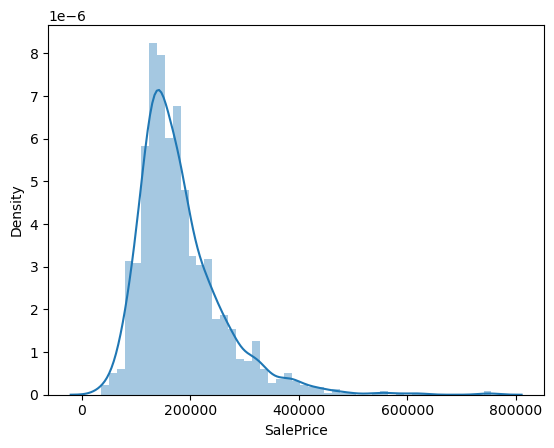

In [110]:
sns.distplot(Housing['SalePrice'])

<Axes: xlabel='SalePrice', ylabel='Density'>

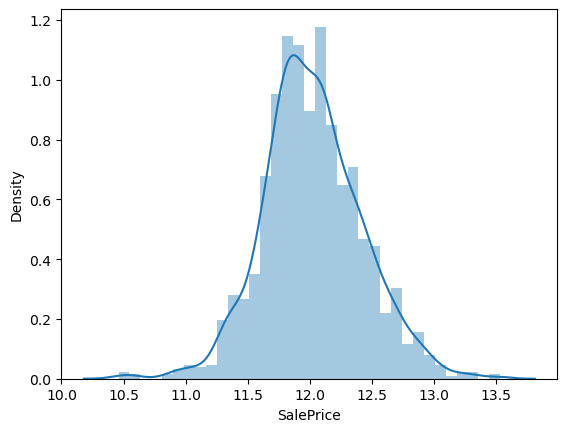

In [111]:
#Apply logarithmic price to see the distribution
Housing['SalePrice'] = np.log1p(Housing['SalePrice'])
sns.distplot(Housing['SalePrice'])

<Axes: xlabel='LotArea', ylabel='Density'>

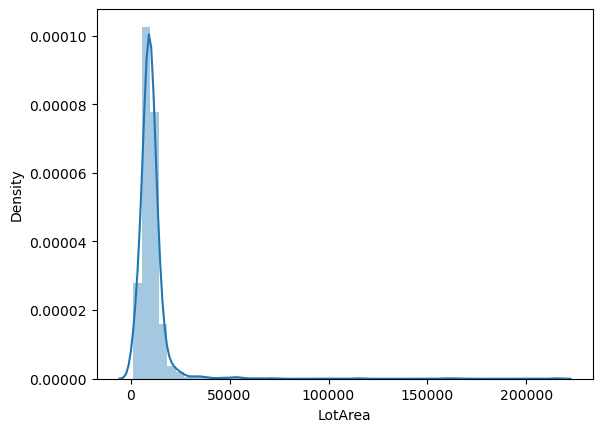

In [112]:
#Slightly skewed
sns.distplot(Housing['LotArea'])

<Axes: xlabel='LotArea', ylabel='Density'>

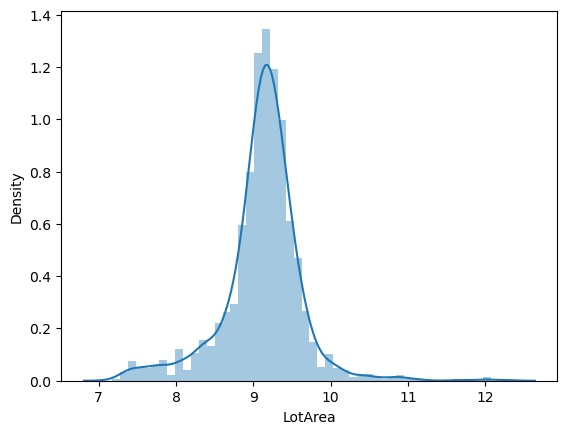

In [113]:
#Apply logarithmic price to see the distribution
Housing['LotArea'] = np.log1p(Housing['LotArea'])
sns.distplot(Housing['LotArea'])

#### Checking 'Sale Price' vs Various Categorical Data

In [114]:
plt.figure(figsize=(30,300))
for i in list(enumerate(categorical)):
    plt.subplot(len(categorical),1,i[0]+1)
    sns.boxplot(x = i[1], y="SalePrice", data= Housing)
    plt.xticks(rotation = 90)
plt.tight_layout(pad = 1)    
plt.show()

In [115]:
# All numeric variables in the dataset
Housing_numeric = Housing.select_dtypes(include=['float64', 'int64' ], exclude = ["object"])
Housing_numeric.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'SalePrice', 'AgeofHouse'],
      dtype='object')

In [175]:
#Visualising Numerical Variables
sns.set()
sns.pairplot(Housing_numeric, size = 5 )
plt.show()

In [176]:
#Correlation of Numerical Variables
correlation = Housing_numeric.corr()
correlation

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,AgeofHouse
LotFrontage,1.000000,0.599460,0.239546,-0.043595,0.195830,0.232576,0.119174,0.381038,0.031873,0.385190,0.107226,0.006620,0.186561,0.054190,0.245232,-0.005627,0.332619,0.249295,0.281393,0.339085,0.088736,0.141734,0.008057,0.064654,0.041063,0.174567,0.005332,0.353288,-0.120601
LotArea,0.599460,1.000000,0.178220,-0.006308,0.122362,0.230978,0.077241,0.351844,0.012810,0.394588,0.138279,0.045220,0.179193,0.038728,0.279173,0.001673,0.360131,0.327765,0.272010,0.322048,0.199855,0.147226,0.010945,0.055700,0.097381,0.091796,0.047792,0.399923,-0.023102
OverallQual,0.239546,0.178220,1.000000,-0.091932,0.407252,0.239666,0.308159,0.537808,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.817185,-0.572629
OverallCond,-0.043595,-0.006308,-0.091932,1.000000,-0.125694,-0.046231,-0.136841,-0.171098,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.036868,0.377325
MasVnrArea,0.195830,0.122362,0.407252,-0.125694,1.000000,0.261256,0.113862,0.360067,-0.068628,0.388052,0.083010,0.027403,0.272999,0.199108,0.102775,-0.038450,0.279568,0.247015,0.361945,0.370884,0.159991,0.122528,-0.109907,0.019144,0.062248,0.011928,-0.029512,0.426776,-0.311479
BsmtFinSF1,0.232576,0.230978,0.239666,-0.046231,0.261256,1.000000,-0.495251,0.522396,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,0.372023,-0.248483
BsmtUnfSF,0.119174,0.077241,0.308159,-0.136841,0.113862,-0.495251,1.000000,0.415360,0.028167,0.240257,-0.422900,-0.095804,0.288886,-0.041118,0.166643,0.030086,0.250647,0.051575,0.214175,0.183303,-0.005316,0.129005,-0.002538,0.020764,-0.012579,-0.035092,-0.023837,0.221985,-0.150619
TotalBsmtSF,0.381038,0.351844,0.537808,-0.171098,0.360067,0.522396,0.415360,1.000000,-0.033245,0.454868,0.307351,-0.000315,0.323722,-0.048804,0.050450,-0.068901,0.285573,0.339519,0.434585,0.486665,0.232019,0.247264,-0.095478,0.037384,0.084489,0.126053,-0.018479,0.612134,-0.391498
LowQualFinSF,0.031873,0.012810,-0.030429,0.025494,-0.068628,-0.064503,0.028167,-0.033245,1.000000,0.134683,-0.047143,-0.005842,-0.000710,-0.027080,0.105607,0.007522,0.131185,-0.021272,-0.094480,-0.067601,-0.025444,0.018251,0.061081,-0.004296,0.026799,0.062157,-0.003793,-0.037963,0.182228
GrLivArea,0.385190,0.394588,0.593007,-0.079686,0.388052,0.208171,0.240257,0.454868,0.134683,1.000000,0.034836,-0.018918,0.630012,0.415772,0.521270,0.100063,0.825489,0.461679,0.467247,0.468997,0.247433,0.330224,0.009113,0.020643,0.101510,0.170205,-0.002416,0.700927,-0.200302


## Plotting Heat map

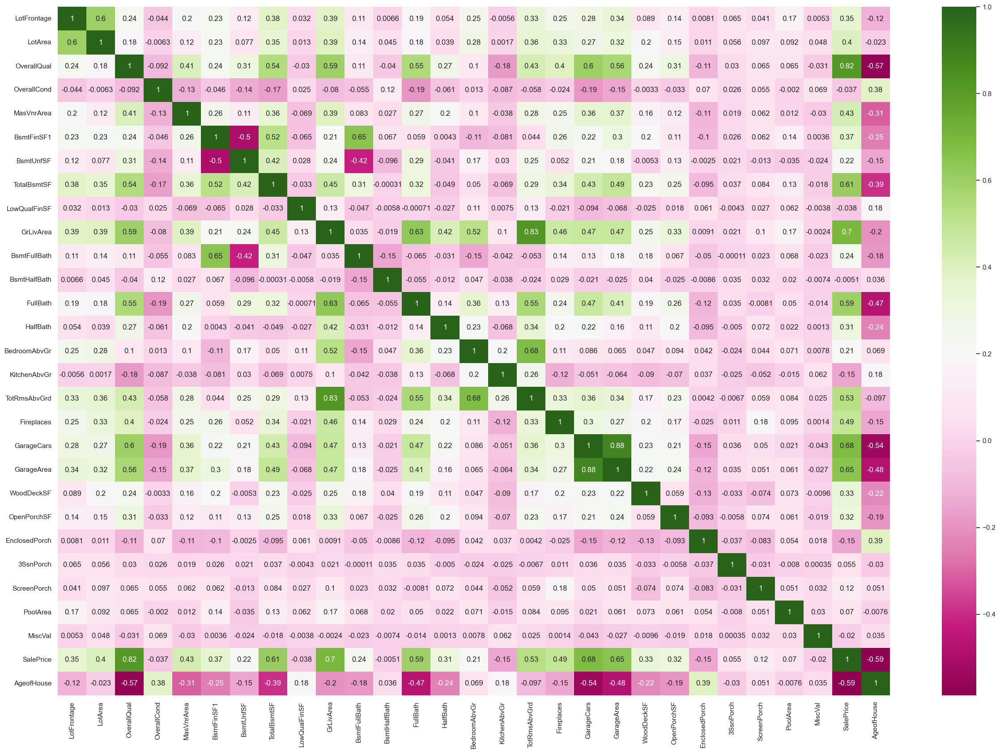

In [177]:
plt.figure(figsize=(30,20))# to mention plot size
sns.heatmap(correlation, cmap="PiYG", annot=True) # to plot heatmap
plt.show()

### Sales Price is Inversely proportional to the Age of House from Heat map

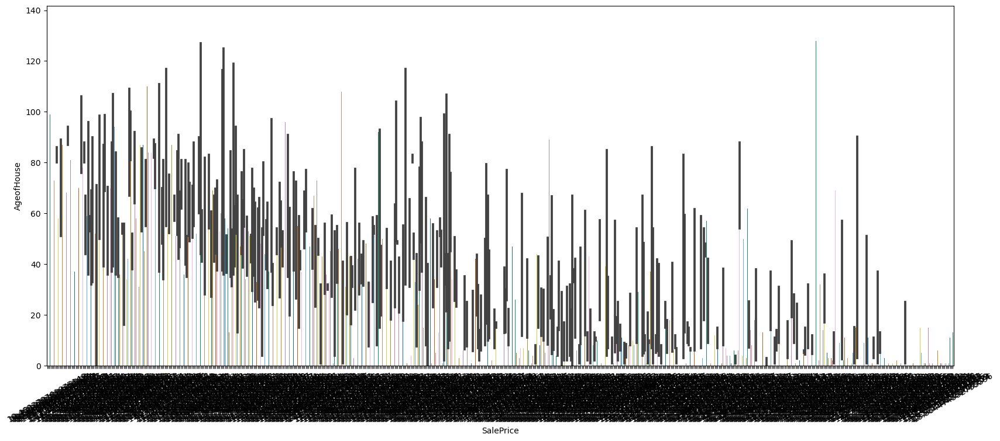

In [118]:
plt.figure(figsize=(20,8))
sns.barplot(data = Housing_numeric, y='AgeofHouse', x='SalePrice', palette="colorblind" , width = 0.2  )
plt.xticks(rotation=30)
plt.show()

# 4. Preparing the data for modelling

In [119]:
#Identify the categorical Variables and then convert to dummy variables
categorical = Housing.select_dtypes(include=['object'])
Housing = pd.get_dummies(Housing, drop_first=True )
print(Housing.shape)
Housing.head()

(1460, 267)


,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,AgeofHouse,MSSubClass_1-STORY_PUD_1946 & NEWER,MSSubClass_1_1/2_STORY_UNFINISHED_ALL_AGES,MSSubClass_1_STORY_1945_OLDER,MSSubClass_1_STORY_1946_NEWER_ALL_STYLES,MSSubClass_1_STORY_W/FINISHED_ATTIC_ALL_AGES,MSSubClass_2-1/2_STORY_ALL_AGES,MSSubClass_2-STORY_1945 & OLDER,MSSubClass_2-STORY_1946 & NEWER,MSSubClass_2-STORY_PUD_1946 & NEWER,MSSubClass_2_FAMILY_CONVERSION_ALL STYLES AND AGES,MSSubClass_DUPLEX_ALL STYLES AND AGES,MSSubClass_PUD_MULTILEVEL_INCL SPLIT LEV/FOYER,MSSubClass_SPLIT_FOYER,MSSubClass_SPLIT_MULTI-LEVEL,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,Alley_none,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_none,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,FireplaceQu_none,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQ

In [120]:
#X holds Independendent Variables
X = Housing.drop(['SalePrice'], axis=1)
print(X.shape)
X.head()

(1460, 266)


,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,AgeofHouse,MSSubClass_1-STORY_PUD_1946 & NEWER,MSSubClass_1_1/2_STORY_UNFINISHED_ALL_AGES,MSSubClass_1_STORY_1945_OLDER,MSSubClass_1_STORY_1946_NEWER_ALL_STYLES,MSSubClass_1_STORY_W/FINISHED_ATTIC_ALL_AGES,MSSubClass_2-1/2_STORY_ALL_AGES,MSSubClass_2-STORY_1945 & OLDER,MSSubClass_2-STORY_1946 & NEWER,MSSubClass_2-STORY_PUD_1946 & NEWER,MSSubClass_2_FAMILY_CONVERSION_ALL STYLES AND AGES,MSSubClass_DUPLEX_ALL STYLES AND AGES,MSSubClass_PUD_MULTILEVEL_INCL SPLIT LEV/FOYER,MSSubClass_SPLIT_FOYER,MSSubClass_SPLIT_MULTI-LEVEL,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,Alley_none,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_none,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,FireplaceQu_none,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQual_Fa,Gar

In [121]:
# Y as target variable or Dependant Variable
y = Housing['SalePrice']
y.head()

0    12.247699
1    12.109016
2    12.317171
3    11.849405
4    12.429220
Name: SalePrice, dtype: float64

### Train/Test Split

In [122]:
# Split the dataframe into train and test sets
np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=0)
print(X_train.shape)
print(X_test.shape)

(1021, 266)
(438, 266)


### Scaling

#### After doing test-train split, we need to scale the variables for better interpretability. 
#### We only need the scale the numeric columns and not the dummy variables. 
#### On Train Set we do scaling by Fit and Transform functions
#### On Test set we do scaling only by Transform function

In [123]:
from sklearn.preprocessing import MinMaxScaler 
scaler = MinMaxScaler()
# Find the numeric columns
X_train_num = X_train.select_dtypes(include=['float64', 'int64'])
columns = X_train_num.columns
# Apply scaler() to all the Numeric columns 
X_train[columns] = scaler.fit_transform(X_train[columns])
X_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,AgeofHouse,MSSubClass_1-STORY_PUD_1946 & NEWER,MSSubClass_1_1/2_STORY_UNFINISHED_ALL_AGES,MSSubClass_1_STORY_1945_OLDER,MSSubClass_1_STORY_1946_NEWER_ALL_STYLES,MSSubClass_1_STORY_W/FINISHED_ATTIC_ALL_AGES,MSSubClass_2-1/2_STORY_ALL_AGES,MSSubClass_2-STORY_1945 & OLDER,MSSubClass_2-STORY_1946 & NEWER,MSSubClass_2-STORY_PUD_1946 & NEWER,MSSubClass_2_FAMILY_CONVERSION_ALL STYLES AND AGES,MSSubClass_DUPLEX_ALL STYLES AND AGES,MSSubClass_PUD_MULTILEVEL_INCL SPLIT LEV/FOYER,MSSubClass_SPLIT_FOYER,MSSubClass_SPLIT_MULTI-LEVEL,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,Alley_none,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_none,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,FireplaceQu_none,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQual_Fa,Gar

#### For Evaluating the Model we need to scale the Test set also

In [124]:
X_test[columns] = scaler.transform(X_test[columns])
X_test.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,AgeofHouse,MSSubClass_1-STORY_PUD_1946 & NEWER,MSSubClass_1_1/2_STORY_UNFINISHED_ALL_AGES,MSSubClass_1_STORY_1945_OLDER,MSSubClass_1_STORY_1946_NEWER_ALL_STYLES,MSSubClass_1_STORY_W/FINISHED_ATTIC_ALL_AGES,MSSubClass_2-1/2_STORY_ALL_AGES,MSSubClass_2-STORY_1945 & OLDER,MSSubClass_2-STORY_1946 & NEWER,MSSubClass_2-STORY_PUD_1946 & NEWER,MSSubClass_2_FAMILY_CONVERSION_ALL STYLES AND AGES,MSSubClass_DUPLEX_ALL STYLES AND AGES,MSSubClass_PUD_MULTILEVEL_INCL SPLIT LEV/FOYER,MSSubClass_SPLIT_FOYER,MSSubClass_SPLIT_MULTI-LEVEL,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,Alley_none,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_none,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,FireplaceQu_none,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQual_Fa,Gar

# 5. Building the model 
### First Linear Model with all features
Let's now build our first model with all the features.

In [136]:
# Instantiate
mlr = LinearRegression()
# Fit a line
mlr.fit(X_train, y_train)
y_train_pred = mlr.predict(X_train)
y_test_pred = mlr.predict(X_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rss1_r = np.sum(np.square(y_train - y_train_pred))
rss2_r = np.sum(np.square(y_test - y_test_pred))
print(rmse_train)
print(rmse_test)
print(r2_train)
print(r2_test)
#Build Matric for final comparison
metric_lin=[]
metric_lin.append(r2_train)
metric_lin.append(r2_test)
metric_lin.append(rss1_r)
metric_lin.append(rss2_r)
metric_lin.append(rmse_train)
metric_lin.append(rmse_test)

0.08316612472419428
23122074252.13784
0.957209304125083
-3.460182246515081e+21


##### Impression: R2 Score shows the model was able to explain well 95.72% of data points from the Training data set. However in the Test set the value is negative very very low. Hence we need to use Regularisation techniques like Ridge or Lasso
### Regularisation using Ridge followed by Lasso

In [137]:
alphas= [0.0001,0.001,0.01,0.05,0.1,0.2,0.3,0.5,1,2,2.5,3,3.5,4,5,6,7,8,9,10,20,25,30,35,40,45,50,55,60,65,70,75,90, 100,200,250,500,1000,10000]
param = {'alpha': alphas}
ridge = Ridge()
grid_search = GridSearchCV(estimator = ridge, 
                           param_grid = param ,
                           scoring = 'neg_mean_absolute_error',
                           cv = 5,
                           verbose = 1,
                           return_train_score=True)
grid_search.fit(X_train, y_train)
best_alpha_ridge = grid_search.best_params_["alpha"]
print(best_alpha_ridge)

Fitting 5 folds for each of 39 candidates, totalling 195 fits
0.3


### Ridge

In [138]:
ridge = Ridge(alpha=best_alpha_ridge)
ridge.fit(X_train,y_train)
y_train_pred = ridge.predict(X_train)
y_test_pred = ridge.predict(X_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rss1_r = np.sum(np.square(y_train - y_train_pred))
rss2_r = np.sum(np.square(y_test - y_test_pred))
print(rmse_train)
print(rmse_test)
print(r2_train)
print(r2_test)
#Build Matric for final comparison
metric_ridge=[]
metric_ridge.append(r2_train)
metric_ridge.append(r2_test)
metric_ridge.append(rss1_r)
metric_ridge.append(rss2_r)
metric_ridge.append(rmse_train)
metric_ridge.append(rmse_test)

0.08628609567784497
0.1870892235738537
0.9539385022841755
0.7734610225705727


###### Impression:
###### After applying Ridge Regularisation, R2 Score has improved significantly on the Test Set.
###### However there is a significant difference in the R2 Score of Training set and Test set 
###### Need further improvement in the R2 Score of the Test Set and hence need to apply another Regularisation - Lasso 
### Lasso

In [139]:
lasso = Lasso()
grid_search = GridSearchCV(estimator = lasso, 
                           param_grid = param ,
                           scoring = 'neg_mean_absolute_error',
                           cv = 5,
                           verbose = 1,
                           return_train_score=True)
grid_search.fit(X_train, y_train)
best_alpha_lasso = grid_search.best_params_["alpha"]
print(best_alpha_lasso)

Fitting 5 folds for each of 39 candidates, totalling 195 fits
0.0001


In [140]:
lasso = Lasso(alpha=best_alpha_lasso)
lasso.fit(X_train,y_train)
y_train_pred = lasso.predict(X_train)
y_test_pred = lasso.predict(X_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rss1_l = np.sum(np.square(y_train - y_train_pred))
rss2_l = np.sum(np.square(y_test - y_test_pred))
print(rmse_train)
print(rmse_test)
print(r2_train)
print(r2_test)
#Build Matric for final comparison
metric_lasso=[]
metric_lasso.append(r2_train)
metric_lasso.append(r2_test)
metric_lasso.append(rss1_l)
metric_lasso.append(rss2_l)
metric_lasso.append(rmse_train)
metric_lasso.append(rmse_test)

0.08790345553865149
0.18944178303005887
0.9521955512768747
0.7677279591774919


##### Impression : 
###### Optimum Value of alpha in Lasso is 0.0001
### Residual Error Terms - shows the error terms are normally distributed

Text(0.5, 0, 'Errors')

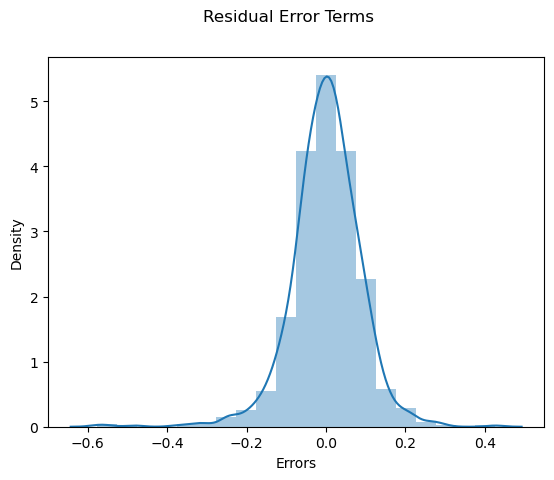

In [141]:
#Residual Error Terms
res = y_train-y_train_pred
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((res), bins = 20)
fig.suptitle('Residual Error Terms')                  # Plot heading 
plt.xlabel('Errors') 

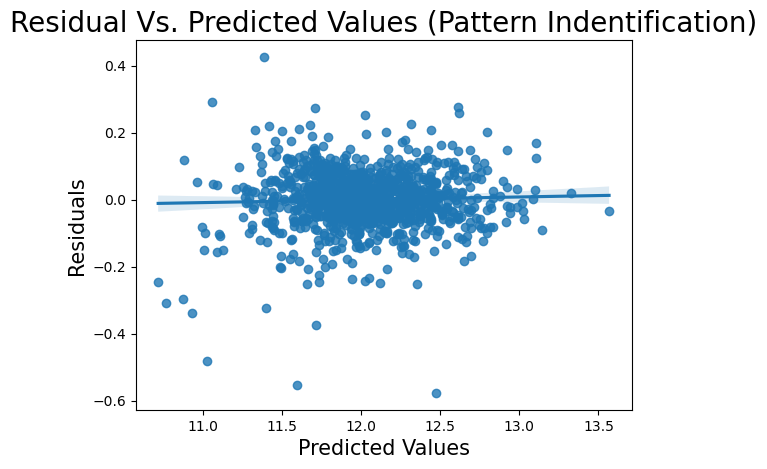

In [142]:
sns.regplot(x=y_train_pred, y=res)
plt.title('Residual Vs. Predicted Values (Pattern Indentification)', fontdict={'fontsize': 20})
plt.xlabel('Predicted Values', fontdict={'fontsize': 15})
plt.ylabel('Residuals', fontdict={'fontsize': 15})
plt.show()

Text(0, 0.5, 'y_test_pred')

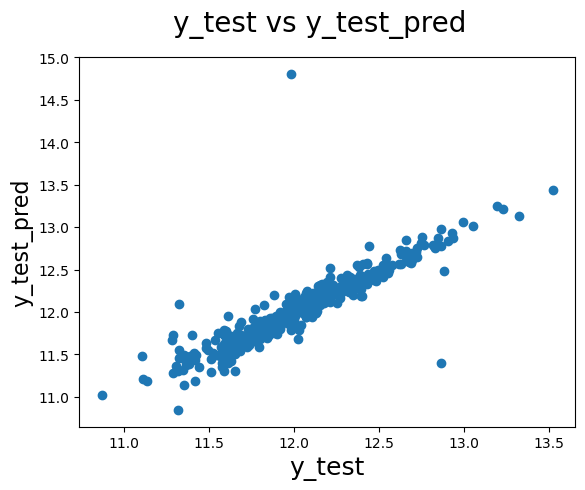

In [143]:
# Plotting y_test and y_pred to understand the spread
fig = plt.figure()
plt.scatter(y_test, y_test_pred)
fig.suptitle('y_test vs y_test_pred', fontsize = 20)              # Plot heading 
plt.xlabel('y_test', fontsize = 18)                          # X-label
plt.ylabel('y_test_pred', fontsize = 16)  

From the above plot, it's evident that the model is doing well on the test set as well. 

### Comparison Metrics

In [144]:
lr_table = {'Metric' : ['R2 Score(Train)', 'R2 Score(Test)','RSS(Train)', 'RSS(Test)', 'MSE(Train)', 'MSE(Test)'], 
           "Linear Regression" : metric_lin,
           "Ridge" : metric_ridge,
           "Lasso" : metric_lasso }
lr_metric = pd.DataFrame(lr_table, columns = ['Metric','Linear Regression',"Ridge","Lasso" ])
lr_metric

,Metric,Linear Regression,Ridge,Lasso
0,R2 Score(Train),9.572093e-01,0.953939,0.952196
1,R2 Score(Test),-3.460182e+21,0.773461,0.767728
2,RSS(Train),7.061853e+00,7.601641,7.889285
3,RSS(Test),2.341681e+23,15.331041,15.719027
4,MSE(Train),8.316612e-02,0.086286,0.087903
5,MSE(Test),2.312207e+10,0.187089,0.189442


### Coefficients Comparison

In [155]:
betas =  pd.DataFrame()
betas["Features"] =  pd.DataFrame(X.columns)
betas["Linear"] = mlr.coef_
betas["Ridge"] = ridge.coef_
betas["Lasso"] = lasso.coef_
betas_temp = betas
betas_lasso = betas_temp.sort_values(by = "Lasso", ascending = False)
betas_ridge = betas.sort_values(by = "Ridge", ascending = False)
print("Lasso Regression Top Features and its coefficients")
betas_lasso


Lasso Regression Top Features and its coefficients


,Features,Linear,Ridge,Lasso
9,GrLivArea,1.029960e+00,0.778998,1.002991
7,TotalBsmtSF,4.670989e-01,0.347881,0.413965
42,MSZoning_FV,5.541423e-01,0.409497,0.408438
2,OverallQual,3.303575e-01,0.359203,0.406698
1,LotArea,4.938803e-01,0.374240,0.364460
44,MSZoning_RL,4.858905e-01,0.361732,0.357727
45,MSZoning_RM,4.888125e-01,0.361156,0.339280
43,MSZoning_RH,4.768729e-01,0.339407,0.336310
3,OverallCond,3.083184e-01,0.294015,0.308741
255,SaleType_ConLD,2.936519e-01,0.261627,0.245530


In [156]:
print("Ridge Regression Top Features and its coefficients")
betas_ridge

Ridge Regression Top Features and its coefficients


,Features,Linear,Ridge,Lasso
9,GrLivArea,1.029960e+00,0.778998,1.002991
42,MSZoning_FV,5.541423e-01,0.409497,0.408438
1,LotArea,4.938803e-01,0.374240,0.364460
44,MSZoning_RL,4.858905e-01,0.361732,0.357727
45,MSZoning_RM,4.888125e-01,0.361156,0.339280
2,OverallQual,3.303575e-01,0.359203,0.406698
7,TotalBsmtSF,4.670989e-01,0.347881,0.413965
43,MSZoning_RH,4.768729e-01,0.339407,0.336310
94,Condition2_Feedr,1.429241e-01,0.309412,0.054671
3,OverallCond,3.083184e-01,0.294015,0.308741


# Problem 2
### Q1
What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

Optimum Value of Alpha for Ridge is .3 and Lasso is 0.0001
When alpha value is doubled, R2score on Training set there is minor changes. However on test set, R2 score is improved. RSS on training/Test set didn’t change for Ridge, but for Lasso there is minor decrease in the RSS value. The mean squared error is reduced by a very small values

In [169]:
lasso_new = Lasso(alpha=0.0002)
lasso_new.fit(X_train,y_train)
y_train_pred = lasso_new .predict(X_train)
y_test_pred = lasso_new .predict(X_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rss1_l = np.sum(np.square(y_train - y_train_pred))
rss2_l = np.sum(np.square(y_test - y_test_pred))
print(rmse_train)
print(rmse_test)
print(r2_train)
print(r2_test)
#Build Matric for final comparison
metric_lasso_dalpha=[]
metric_lasso_dalpha.append(r2_train)
metric_lasso_dalpha.append(r2_test)
metric_lasso_dalpha.append(rss1_r)
metric_lasso_dalpha.append(rss2_r)
metric_lasso_dalpha.append(rmse_train)
metric_lasso_dalpha.append(rmse_test)
lasso_double = pd.DataFrame()
lasso_double["Features"] = X.columns
lasso_double["Lasso_Coefficients"] = lasso_new.coef_
lasso_newalpha = lasso_double.sort_values(by = "Lasso_Coefficients", ascending = False)
lasso_newalpha 

0.09231860807660343
0.18010243233392
0.9472727751086476
0.7900651463115739


,Features,Lasso_Coefficients
9,GrLivArea,0.985721
2,OverallQual,0.453984
7,TotalBsmtSF,0.333838
1,LotArea,0.325797
42,MSZoning_FV,0.314227
3,OverallCond,0.308098
44,MSZoning_RL,0.265362
45,MSZoning_RM,0.240925
43,MSZoning_RH,0.232551
255,SaleType_ConLD,0.179756


In [166]:
metric_lasso_dalpha

[0.9472727751086476,
 0.7900651463115739,
 7.601641403780066,
 15.331041378930728,
 0.09231860807660343,
 0.18010243233392]

In [170]:
ridge_new = Ridge(alpha=0.6)
ridge_new.fit(X_train,y_train)
y_train_pred = ridge_new .predict(X_train)
y_test_pred = ridge_new .predict(X_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rss1_l = np.sum(np.square(y_train - y_train_pred))
rss2_l = np.sum(np.square(y_test - y_test_pred))
print(rmse_train)
print(rmse_test)
print(r2_train)
print(r2_test)
#Build Matric for final comparison
metric_ridge_dalpha=[]
metric_ridge_dalpha.append(r2_train)
metric_ridge_dalpha.append(r2_test)
metric_ridge_dalpha.append(rss1_r)
metric_ridge_dalpha.append(rss2_r)
metric_ridge_dalpha.append(rmse_train)
metric_ridge_dalpha.append(rmse_test)
ridge_double = pd.DataFrame()
ridge_double["Features"] = X.columns
ridge_double["Ridge_Coefficients"] = ridge_new.coef_
ridge_newalpha = ridge_double.sort_values(by = "Ridge_Coefficients", ascending = False)
ridge_newalpha 

0.08930248126422194
0.17799534906767212
0.9506617807543011
0.7949486185023866


,Features,Ridge_Coefficients
9,GrLivArea,0.657613
2,OverallQual,0.369039
42,MSZoning_FV,0.328552
1,LotArea,0.321569
7,TotalBsmtSF,0.299879
45,MSZoning_RM,0.292483
44,MSZoning_RL,0.291938
3,OverallCond,0.285349
94,Condition2_Feedr,0.269962
43,MSZoning_RH,0.266168


In [167]:
lr_tables = {'Metric' : ['R2 Score(Train)', 'R2 Score(Test)','RSS(Train)', 'RSS(Test)', 'MSE(Train)', 'MSE(Test)'], 
           "Ridge_New" : metric_ridge_dalpha,
           "Lasso_New" : metric_lasso_dalpha }
lr_metrics = pd.DataFrame(lr_tables, columns = ['Metric',"Ridge_New","Lasso_New" ])
lr_metrics

,Metric,Ridge_New,Lasso_New
0,R2 Score(Train),0.950662,0.947273
1,R2 Score(Test),0.794949,0.790065
2,RSS(Train),7.601641,7.601641
3,RSS(Test),15.331041,15.331041
4,MSE(Train),0.089302,0.092319
5,MSE(Test),0.177995,0.180102


### Q2 
You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

Answer: I would prefer to use Lasso as it will have inbuilt feature to eliminate the least relevant column by making the coefficient 0 or negative values. 

### Q3
After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

Top 5 most important predictor variables in Lasso model was GrLivArea, TotalBsmtSF, MSZoning_FV, OverallQual, LotArea
After removing these top predictor variables we got below TotRmsAbvGrd, BsmtFinSF1, OverallCond GarageArea and FullBath are the top predictors



In [172]:
#X holds Independendent Variables
X = X.drop(['GrLivArea', 'TotalBsmtSF', 'MSZoning_FV', 'OverallQual', 'LotArea'], axis=1)
y = Housing['SalePrice']
np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=0)

from sklearn.preprocessing import MinMaxScaler 
scaler1 = MinMaxScaler()
# Find the numeric columns
X_train_num = X_train.select_dtypes(include=['float64', 'int64'])
columns = X_train_num.columns
# Apply scaler() to all the Numeric columns 
X_train[columns] = scaler1.fit_transform(X_train[columns])
X_test[columns] = scaler1.transform(X_test[columns])

lasso = Lasso()
grid_search = GridSearchCV(estimator = lasso, 
                           param_grid = param ,
                           scoring = 'neg_mean_absolute_error',
                           cv = 5,
                           verbose = 1,
                           return_train_score=True)
grid_search.fit(X_train, y_train)
best_alpha_lasso = grid_search.best_params_["alpha"]
print('best_alpha_lasso:')
print(best_alpha_lasso)
lasso = Lasso(alpha=best_alpha_lasso)
lasso.fit(X_train,y_train)
y_train_pred = lasso.predict(X_train)
y_test_pred = lasso.predict(X_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rss1_l = np.sum(np.square(y_train - y_train_pred))
rss2_l = np.sum(np.square(y_test - y_test_pred))
print('rmse_train:')
print(rmse_train)
print('rmse_test:')
print(rmse_test)
print('r2_train')
print(r2_train)
print('r2_test')
print(r2_test)
coeff =  pd.DataFrame()
coeff["Features"] =  pd.DataFrame(X.columns)
coeff["Lasso"] = lasso.coef_
coeff = coeff.sort_values(by = "Lasso", ascending = False)
print("Lasso Regression Top Features and its coefficients")


Fitting 5 folds for each of 39 candidates, totalling 195 fits
best_alpha_lasso:
0.001
rmse_train:
0.13063930913406657
rmse_test:
0.15641108176186927
r2_train
0.8944145272455549
r2_test
0.8416637227008404
Lasso Regression Top Features and its coefficients


In [174]:
coeff

,Features,Lasso
12,TotRmsAbvGrd,0.481110
3,BsmtFinSF1,0.340347
1,OverallCond,0.307525
15,GarageArea,0.262322
8,FullBath,0.243634
4,BsmtUnfSF,0.243135
9,HalfBath,0.135809
13,Fireplaces,0.129160
78,Neighborhood_StoneBr,0.125861
62,Neighborhood_Crawfor,0.116457


# Q4
How can you make sure that a model is robust and generalisable? What are the implications of the same for the 
accuracy of the model and why?

Model robustness means how well a model can handle variations in the data, such as noise, outliers, or changes 
in distribution. A robust model should be able to generalize well to new or unseen data and avoid overfitting or 
underfitting. Model accuracy measures how well a model predicts the correct outcome for a given input data. 
A high accuracy model should be able to capture the true relationship between the input and the output variables 
and minimize the error rate.

#### 1.Identification of Outliers and removing it
#### 2.Imputing the missing values during data Pre-processing
#### 3.If the distribution curve is not a normal distribution applying log scale will help
#### 4.Feature Engineering helps to derive the values or add more relevant features
#### 5.Feature Selection helps to select the relevant features for model prediction
#### 6.Cross Validation strategies – Apply k-fold or leave-one-out cross-validation to ensure that the model generalizes 
####   well to different data subsets, including those containing outliers.
#### 7.Regularisation - Optimise or try different values of alphas while using Lasso/Ridge and remove Overfitting.
#### 8.R2 Scoring
#### 9.Mean Square Error
To make sure that the model is robust and generalisable the model needs to be simple. We need to adjust the 
hyperparameters of the models to find the optimal values that minimize the error or maximize the R2Score of the 
Training and Test data. Accuracy can be viewed as the complement of the error rate. In other words, accuracy is equal to 
1 - error rate. We need to use various methods to optimize and tune your models, such as grid search, 
regularization techniques, such as lasso, ridge and prevent overfitting. 
